In [11]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import convolve2d

In [12]:
image = cv2.imread('kitten.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# 9

Напишите скрипт для улучшения резкости изображения с использованием Лапласина. Основная стратегия состоит в том, чтобы получить новое изображение по формуле 𝑔(𝑥,𝑦)=𝑓(𝑥,𝑦)+𝑐∆𝑓(𝑥,𝑦), где 𝑓(𝑥,𝑦)−старое изображение, 𝑔(𝑥,𝑦)− результирующее изображение. Выполните улучшение данного изображения с использованием разных масок для Лапласиана и разных значений параметра 𝑐. Выведите все получающиеся промежуточные изображения. 

In [13]:
def sharpening_channel(channel, c):    
    mask = np.array([[0, 1, 0],
                    [1, -4, 1],
                    [0, 1, 0]])
    channel_mask = convolve2d(channel, mask, mode='same')
    return channel + channel_mask * c

def sharpening(image, c):
    r_filter = sharpening_channel(image[:, :, 0], c)
    g_filter = sharpening_channel(image[:, :, 1], c)
    b_filter = sharpening_channel(image[:, :, 2], c)
    result = cv2.merge((r_filter, g_filter, b_filter))
    return np.clip(result, 0, 255).astype(np.uint8)

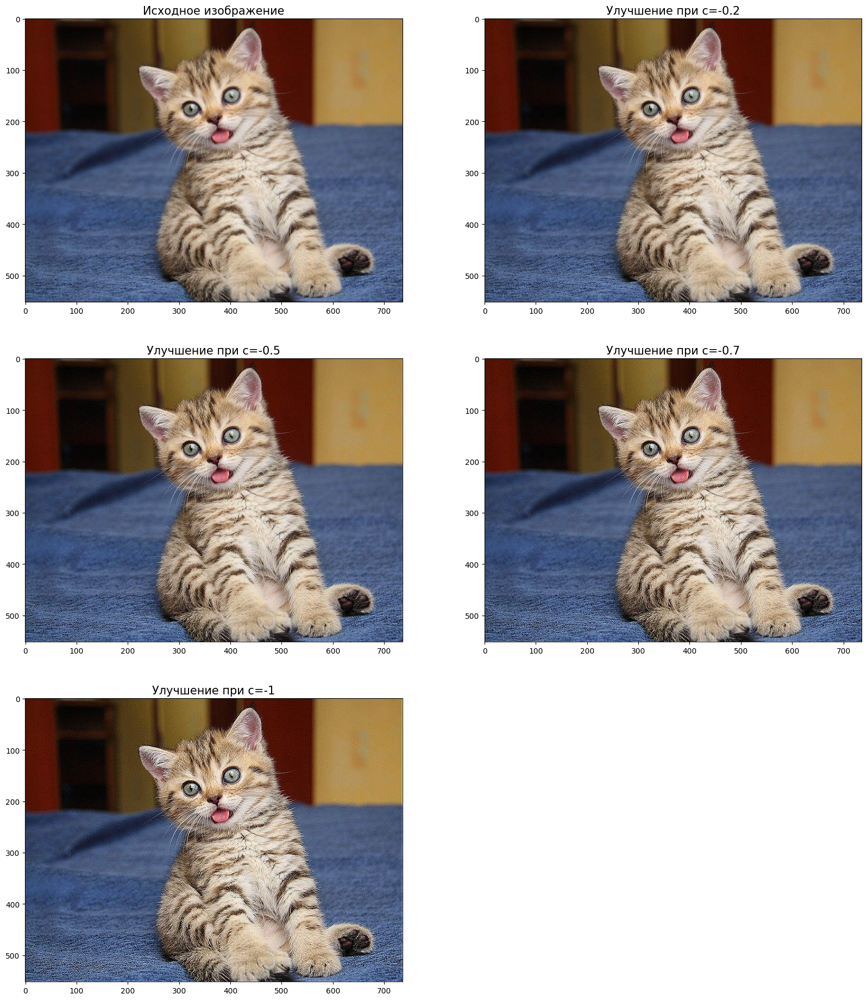

In [14]:
plt.figure(figsize=(20, 23))
plt.subplot(321), plt.imshow(image), plt.title('Исходное изображение', fontsize=15)
plt.subplot(322), plt.imshow(sharpening(image, c=-0.2)), plt.title('Улучшение при c=-0.2', fontsize=15)
plt.subplot(323), plt.imshow(sharpening(image, c=-0.5)), plt.title('Улучшение при c=-0.5', fontsize=15)
plt.subplot(324), plt.imshow(sharpening(image, c=-0.7)), plt.title('Улучшение при c=-0.7', fontsize=15)
plt.subplot(325), plt.imshow(sharpening(image, c=-1)), plt.title('Улучшение при c=-1', fontsize=15)
plt.show()

In [15]:
def extended_sharpening_channel(channel, c):    
    mask = np.array([[1, 1, 1],
                    [1, -8, 1],
                    [1, 1, 1]])
    channel_mask = convolve2d(channel, mask, mode='same')
    return channel + channel_mask * c

def extended_sharpening(image, c):
    r_filter = extended_sharpening_channel(image[:, :, 0], c)
    g_filter = extended_sharpening_channel(image[:, :, 1], c)
    b_filter = extended_sharpening_channel(image[:, :, 2], c)
    result = cv2.merge((r_filter, g_filter, b_filter))
    return np.clip(result, 0, 255).astype(np.uint8)

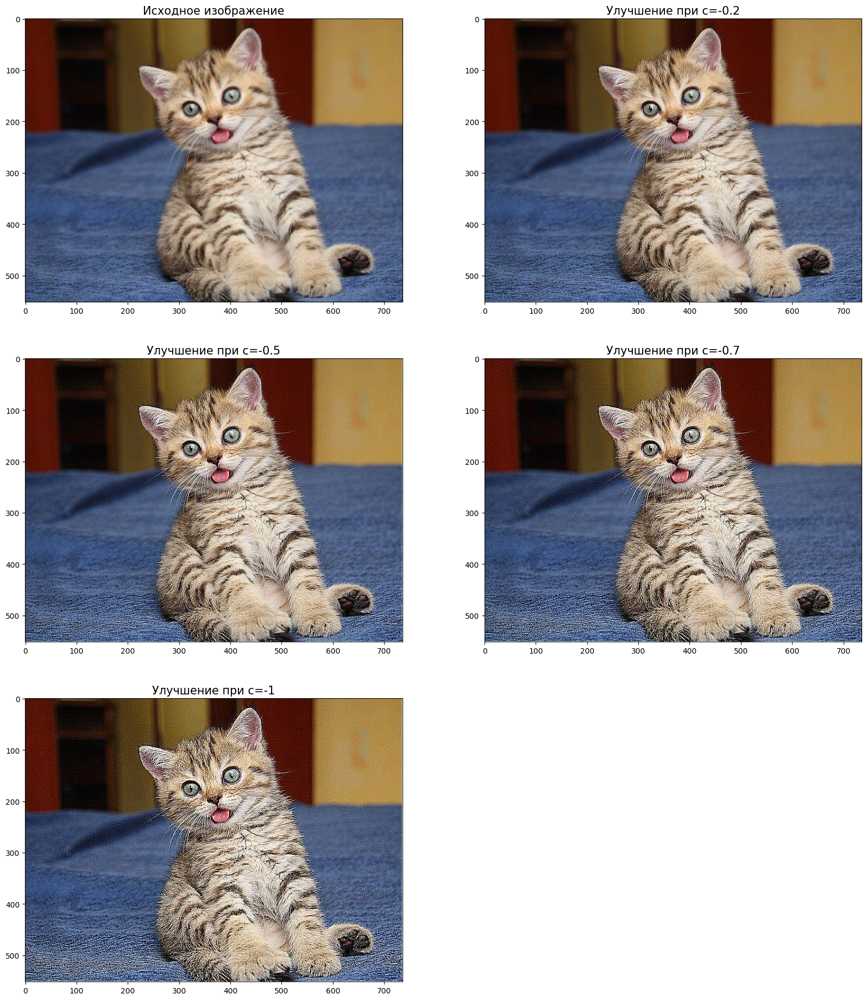

In [16]:
plt.figure(figsize=(20, 23))
plt.subplot(321), plt.imshow(image), plt.title('Исходное изображение', fontsize=15)
plt.subplot(322), plt.imshow(extended_sharpening(image, c=-0.2)), plt.title('Улучшение при c=-0.2', fontsize=15)
plt.subplot(323), plt.imshow(extended_sharpening(image, c=-0.5)), plt.title('Улучшение при c=-0.5', fontsize=15)
plt.subplot(324), plt.imshow(extended_sharpening(image, c=-0.7)), plt.title('Улучшение при c=-0.7', fontsize=15)
plt.subplot(325), plt.imshow(extended_sharpening(image, c=-1)), plt.title('Улучшение при c=-1', fontsize=15)
plt.show()